<div style="background-color: #d9ffd4; padding: 20px; border-radius: 10px;">
    <h1 style="color: #2F4F4F; font-family: Calibri, sans-serif; text-align: center;">Clase 8</h1>
    <p style="color: #2F4F4F; font-family: Calibri, Courier, monospace; text-align: center; font-size: 24px;">
        Aplicaciones de los métodos de búsqueda de raíces y derivada numérica
    </p>
</div>

Grafique la siguiente ecuación polar de una orbita planetaria elíptica $r(t)$:

$$ r(t) = \frac{a(1-e^2)}{1+e\cos(\omega t + \phi)}$$

donde $a$ corresponde al semieje mayor, $e$ la excentricidad de la orbita, $\omega$ la rapidez angular del planeta y $\phi$ la fase.

Para graficar, recuerde que debe calcular primero las componentes $x(t)$ e $y(t)$ de la curva mediante:

$$ x(t) = \cos(\omega t + \phi) \cdot r(t) $$

$$ y(t) = \sin(\omega t + \phi) \cdot r(t) $$


Modifique los parámetros $a$, $e$, $\omega$ y $\phi$ para observar su efecto sobre la curva. Primero defina un rango de tiempo $t$, desde $t=0$ hasta $t=T$, donde $T$ corresponde al periodo orbital (es decir, el tiempo que tarda el planeta en completar una vuelta) y se relaciona con la rapidez angular $\omega$ de la siguiente manera $$T = \frac{2\pi}{\omega}$$

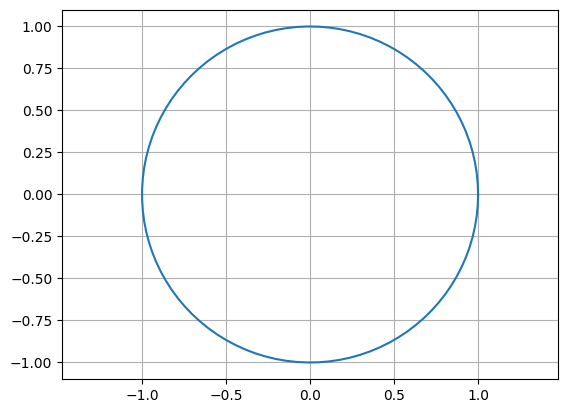

In [7]:
# Implementación de la curva
import numpy as np
import matplotlib.pyplot as plt

omega = 10 # rapidez angular de un planeta
T = 2*np.pi / omega  # periodo en función de la rapidez angular
t_values = np.linspace(start=0, stop=T, num=100, endpoint=True) # rango de tiempo


def r(t, a, e, omega, phi):
    return a*(1 - e**2) / (1 + e*np.cos(omega*t+phi))

def x(t, a, e, omega, phi):
    return np.cos(omega*t + phi) * r(t, a, e, omega, phi)

def y(t, a, e, omega, phi):
    return np.sin(omega*t + phi) * r(t, a, e, omega, phi)

x_values = x(t_values, a=1, e=0, omega=10, phi=0)
y_values = y(t_values, a=1, e=0, omega=10, phi=0)

plt.plot(x_values, y_values)
plt.axis("equal")
plt.grid()


Defina las órbitas de dos planetas, que tengan distintos parámetros orbitales, y obtenga sus coordenadas cartesianas $x_1(t)$, $y_1(t)$ y $x_2(t)$, $y_2(t)$:

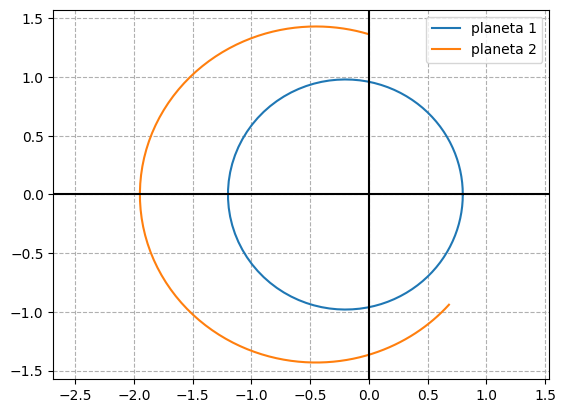

In [15]:
# Defina las orbitas y grafíquelas acá

# planeta 1
x1 = x(t_values, a=1, e=0.2, omega=10, phi=0)
y1 = y(t_values, a=1, e=0.2, omega=10, phi=0)

# planeta 2
x2 = x(t_values, a=1.5, e=0.3, omega=6, phi=np.pi/2)
y2 = y(t_values, a=1.5, e=0.3, omega=6, phi=np.pi/2)

plt.plot(x1, y1, label="planeta 1")
plt.plot(x2, y2, label="planeta 2")
plt.axis("equal")
plt.axvline(0, color="k")
plt.axhline(0, color="k")
plt.grid(ls="--")
plt.legend()

Podemos calcular ahora, la distancia de separación entre los dos planetas, en cada instante de tiempo con la fórmula de distancia euclidiana:

$$ s = \sqrt{(x_1 - x_2)^2 + (y_1 - y_2)^2} $$

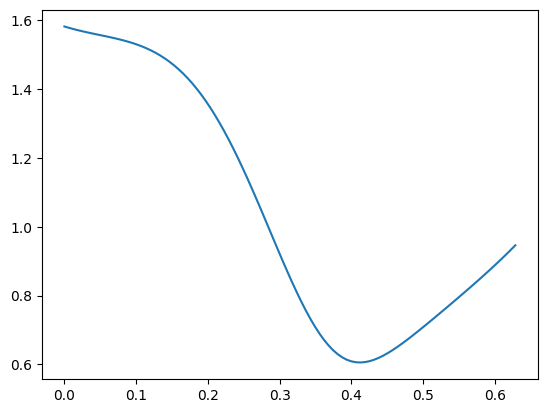

In [16]:
# calcule la distancia euclidana para cada instante de tiempo t
s_values = np.sqrt( (x1 - x2)**2 + (y1 - y2)**2 )

plt.plot(t_values, s_values)

¿Cómo podemos determinar los tiempos en los cuales la distancia entre los dos cuerpos es máxima o mínima? Es decir, los mínimos y máximos locales de la función $s(t)$?. Vea la siguiente animación para ilustrar lo que se pide:

In [17]:
%%capture
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

class Orbita:
    def __init__(self, a, e, omega, phi):
        self.a = a
        self.e = e
        self.omega = omega
        self.phi = phi

    def calcular_r(self, t):
        return self.a * (1 - self.e ** 2) / (1 + self.e * np.cos(self.omega * t + self.phi))

    def coordenadas(self, t_values):
        x_values = self.calcular_r(t_values) * np.cos(self.omega * t_values + self.phi)
        y_values = self.calcular_r(t_values) * np.sin(self.omega * t_values + self.phi)
        return x_values, y_values

# Parámetros de la órbita
omega = 10
phi1 = 0
phi2 = np.pi/3

# Crear instancias de la clase Orbita
orbita1 = Orbita(a=1, e=0.5, omega=2*omega, phi=phi1)
orbita2 = Orbita(a=2, e=0.6, omega=omega, phi=phi2)

# Valores de tiempo
T = 2 * np.pi / omega
t_values = np.linspace(start=0, stop=T, num=500, endpoint=True)

# Coordenadas de las órbitas
x1_values, y1_values = orbita1.coordenadas(t_values)
x2_values, y2_values = orbita2.coordenadas(t_values)

s = np.sqrt( (x1_values - x2_values)**2 + (y1_values - y2_values)**2 )

# Crear la figura y los ejes
fig, ax = plt.subplots(1,2, figsize=(12,6))
ax[0].scatter(0, 0, marker=".", color="k")
ax[0].plot(x1_values, y1_values, ls=":")
ax[0].plot(x2_values, y2_values, ls=":")
ax[0].axis("equal")

x1, y1 = orbita1.coordenadas(0)
x2, y2 = orbita2.coordenadas(0)

ax[0].scatter(x1,y1, marker="o")
ax[0].scatter(x2,y2, marker="o")

line, = ax[0].plot([x1, x2], [y1, y2], 'k--')  # Línea recta entre los puntos marcados
point1 = ax[0].scatter(x1, y1, marker="o")
point2 = ax[0].scatter(x2, y2, marker="o")

ax[1].plot(t_values,s)
point3 = ax[1].scatter(t_values[0], s[0], marker="x", color="red")

for a in ax: a.grid(ls="--")

def update(frame):
    ti = T * frame / 100
    x1, y1 = orbita1.coordenadas(ti)
    x2, y2 = orbita2.coordenadas(ti)
    line.set_data([x1, x2], [y1, y2])
    # Actualizar las posiciones de los puntos de scatter
    point1.set_offsets([[x1, y1]])
    point2.set_offsets([[x2, y2]])
    si = np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
    point3.set_offsets([[ti, si]])

# Crear la animación
ani = FuncAnimation(fig, update, frames=100, interval=100)
plt.show()


In [18]:
from IPython.display import HTML
HTML(ani.to_jshtml())

Copie y pegue la definición de su función $r(t)$, $x(t)$, $y(t)$, vuelva a definir las orbitas para cada planeta y calcule $s(t)$ (se pide esto ya es probable que para crear la animación sus parámetros se hayan sobreescrito).

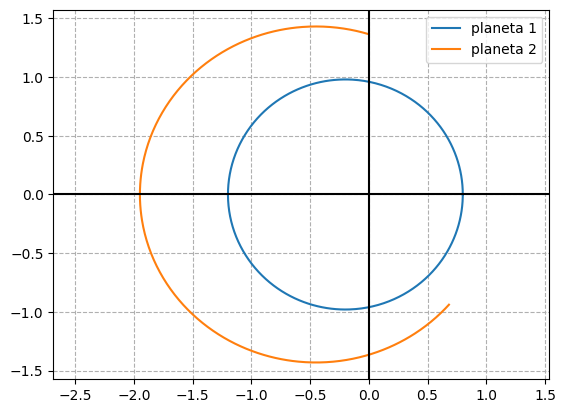

In [19]:
# Implementación de la curva

# Defina las orbitas y grafíquelas acá

# planeta 1
x1 = x(t_values, a=1, e=0.2, omega=10, phi=0)
y1 = y(t_values, a=1, e=0.2, omega=10, phi=0)

# planeta 2
x2 = x(t_values, a=1.5, e=0.3, omega=6, phi=np.pi/2)
y2 = y(t_values, a=1.5, e=0.3, omega=6, phi=np.pi/2)

plt.plot(x1, y1, label="planeta 1")
plt.plot(x2, y2, label="planeta 2")
plt.axis("equal")
plt.axvline(0, color="k")
plt.axhline(0, color="k")
plt.grid(ls="--")
plt.legend()

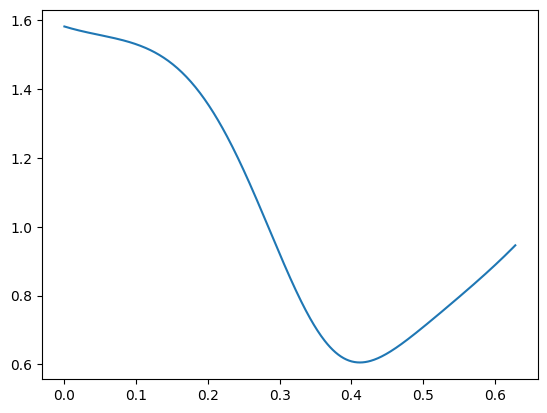

In [21]:
s_values = np.sqrt( (x1-x2)**2 + (y1-y2)**2 )

plt.plot(t_values, s_values)

En principio, podemos derivar $s(t)$ e igualar a cero:

$$ \frac{ds}{dt} = 0 $$

Sin embargo, derivar esta función analíticamente conlleva mucho trabajo, por lo que optaremos por el método de diferencia central para calcular esta derivada. Ahora considere que no posee expresión analítica, sino que trabaje $s(t)$ como un set de datos, es decir, la derivada numérica tiene esta definición:

<!-- $$ s'(t_n) = \left. \frac{ds}{dt} \right |_{t_n} = \frac{s_{n+1}- s_{n-1}}{t_{n+1} - t_{n-1}} $$ -->

<center>
  <img src="discrete_central.png" alt="Descripción de la imagen" style="width:50%;">
</center>


In [ ]:
# Función para calcular la derivada numérica utilizando el método de diferencia central
def central_difference(t_values, s_values):

    # central difference
    #return f(x+h) - f(x-h) / (2*h) # f conocida analíticamente

    #ejemplo: la derivada en s_values[10]

    dt = t_values[1] - t_values[0]
    n = len(t_values)

    ds_values = np.zeros(n)

    for i in range(1, n-1):
        ds_values[i] = (s_values[i+1] - s_values[i-1]) / (2 * dt)


    return ds_values

ds_values = central_difference(t_values, s_values)



IndexError: index 498 is out of bounds for axis 0 with size 498

Ahora sobre esta función, calcularemos sus ceros con el método de Newton-Rapson. Nuevamente, considere que el método de Newton-Rapson recibe un set de datos, `s_values` y `t_values` en vez de una expresión analítica que se pueda evaluar.

In [ ]:
def newton_rapson(s_values, t_values, t0, delta=1e-5, iter_max=5000):

    dt = t_values[1] - t_values[0]
    t0_idx = np.argmin(np.abs(t_values - t0))
    t0 = t_values[t0_idx]
    ds_values = central_difference(t_values, s_values)

    s_values = s_values[1:-1]
    t_values = t_values[1:-1]

    n=0
    while abs(s_values[t0_idx]) >= delta: # delta tolerancia
        t0 = t0 - s_values[t0_idx] / ds_values[t0_idx]
        #print(t0)
        t0_idx = np.argmin(np.abs(t_values - t0))
        n=n+1

        if n == iter_max:
            break

    return t0, t0_idx, n


Roots = []
Roots_idx = []

# Barrimos de t0 = 0 hasta 1 para encontrar todas las raices
for t0 in np.arange(0, 1, 0.1):

    t_out, t_out_idx, n = newton_rapson(s_values=ds_values, t_values=t_values[1:-1], t0=t0)
    Roots.append(t_out)
    Roots_idx.append(t_out_idx)

Roots_idx = np.unique(np.array(Roots_idx)) # Nos quedamos solo con los valores únicos
print(Roots_idx)

In [ ]:
print(f"Tiempos donde ocurren los máximos y mínimos locales: {np.round(t_values[1:-1][Roots_idx], 2)}")

Ahora a graficar!

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(12,5))

ax[0].plot(t_values[1:-1], ds_values)
ax[0].grid(ls="--")
ax[0].axhline(0, color="gray")
ax[0].scatter(x=t_values[1:-1][Roots_idx], y=np.zeros_like(Roots_idx), marker="x", color="red")
ax[0].set_xlabel("t")
ax[0].set_ylabel("$s'(t)$")

ax[1].plot(t_values, s_values)
ax[1].grid(ls="--")
ax[1].scatter(x=t_values[1:-1][Roots_idx], y=s_values[1:-1][Roots_idx], marker="x", color="red")
ax[1].set_xlabel("t")
ax[1].set_ylabel(r"$s(t)$")

Hemos encontrado numéricamente estos puntos críticos. Grafiquemos en la trayectoria:

In [ ]:
plt.plot(x1, y1, ls=":", label="orbita 1")
plt.plot(x2, y2, ls=":", label="orbita 2")

plt.scatter(x=x1[1:-1][Roots_idx[0]], y=y1[1:-1][Roots_idx[0]], marker="x", color="red")
plt.scatter(x=x2[1:-1][Roots_idx[0]], y=y2[1:-1][Roots_idx[0]], marker="x", color="red")
plt.grid(ls="--")
plt.scatter(0,0, marker=".", color="k")
plt.xlabel("x")
plt.ylabel("y")

plt.legend()
plt.axis("equal")

<div style="background-color: #d9ffd4; color: black; padding: 10px; border-radius: 5px;">

**Conclusión:** ¿Qué aprendimos?

Aplicamos los métodos de diferenciación numérica y búsqueda de raíces para encontrar los tiempos en los cuales un sistema de dos planetas se encuentran a la distancia mínima o máxima en su trayecto orbital.

**Próxima clase:** Interpolación Lineal

</div>

<div style="padding: 15px; border-top: 2px solid #2F4F4F; margin-top: 30px; background-color: var(--custom-bg-color); color: var(--custom-text-color);">
    <p style="font-family: Calibri, sans-serif; text-align: left; font-size: 16px;">
        Omar Fernández <br>
        Profesor de Física Computacional III para Astrofísica <br>
        Ingeniero Físico <br>
        <a href="mailto:omar.fernandez.o@usach.cl" class="email-link">omar.fernandez.o@usach.cl</a> <br>
    </p>
</div>

<style>
:root {
    --custom-bg-color: #F8F8F8;
    --custom-text-color: #2F4F4F;
    --custom-link-color: blue;
}

@media (prefers-color-scheme: dark) {
    :root {
        --custom-bg-color: #444444;
        --custom-text-color: #F8F8F8;
        --custom-link-color: magenta;
    }
}

.email-link {
    color: var(--custom-link-color);
}
</style>